# Community Detection - Lab

## Introduction

In this lab, you'll once again work to cluster a network dataset. This time, you'll be investigating a meetup dataset for events occurring in Nashville.

## Objectives

You will be able to:
- Cluster a social network into subgroups

## Load the Dataset

To start, load the dataset `'nashville-meetup/group-edges.csv'` as a pandas Dataframe. 

In [1]:
#Your code here
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import networkx as nx
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('nashville-meetup/group-edges.csv')
df.head()

,Unnamed: 0,group1,group2,weight
0,0,19292162,535553,2
1,1,19292162,19194894,1
2,2,19292162,19728145,1
3,3,19292162,18850080,2
4,4,19292162,1728035,1


To add some descriptive data, import the file `'nashville-meetup/meta-groups.csv'`.

In [3]:
#Your code here
data = pd.read_csv('nashville-meetup/meta-groups.csv')
data.head()

,group_id,group_name,num_members,category_id,category_name,organizer_id,group_urlname
0,339011,Nashville Hiking Meetup,15838,23,Outdoors & Adventure,4353803,nashville-hiking
1,19728145,Stepping Out Social Dance Meetup,1778,5,Dancing,118484462,steppingoutsocialdance
2,6335372,Nashville soccer,2869,32,Sports & Recreation,108448302,Nashville-soccer
3,10016242,NashJS,1975,34,Tech,8111102,nashjs
4,21174496,20's & 30's Women looking for girlfriends,2782,31,Socializing,184580248,new-friends-in-Nashville


## Transform to a Network Representation

Take the Pandas DataFrame and transform it into a graph representation via NetworkX. Make nodes the names of the various groups within the Nashville area. The edges should be the weights between these groups.

In [14]:
#Your code here
name_dict = dict(zip(data.group_id, data.group_name))

name_dict[339011]

'Nashville Hiking Meetup'

In [18]:
G = nx.Graph()

for row in df.index:
    source = name_dict[df.group1[row]]
    target = name_dict[df.group2[row]]
    weight = df.weight[row]
    G.add_edge(source, target, weight=weight)

## Visualize the Network

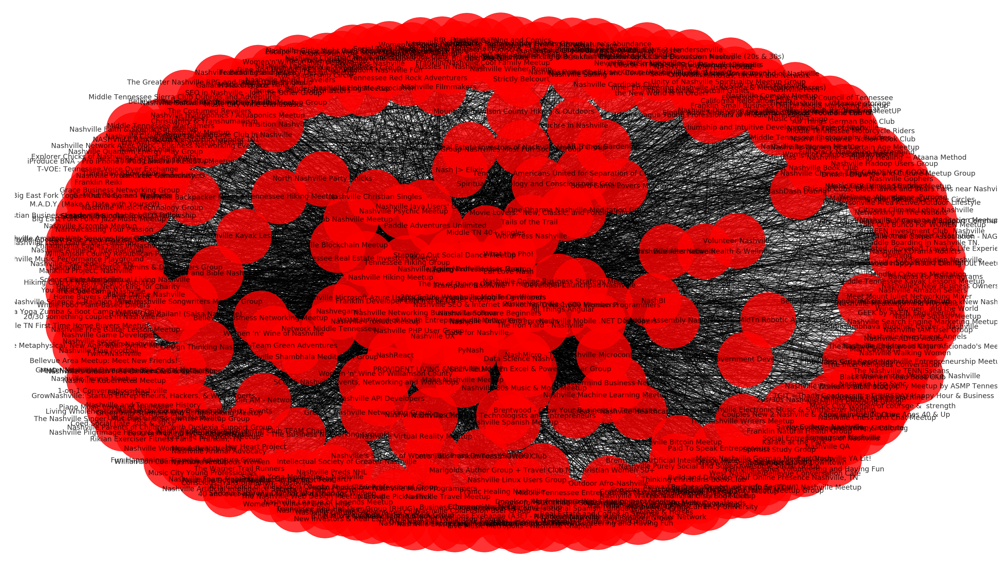

In [21]:
#Your code here
plt.figure(figsize=(35,20))
nx.draw(G, pos=nx.spring_layout(G, k=2, seed=10), node_size=20000, 
        with_labels=True, alpha=0.8, font_size=18);

## Refine the Visual

As you should see, the initial visualization is a globular mess! Refine the visualization to better picture the center core of the  network.

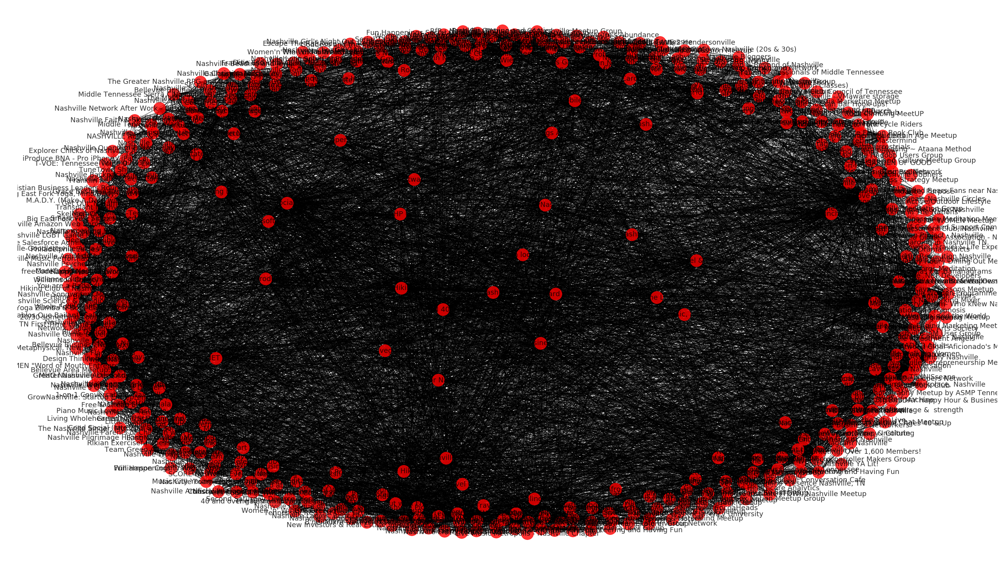

In [24]:
#Your code here
plt.figure(figsize=(35,20))
nx.draw(G, pos=nx.spring_layout(G, k=4, seed=10), node_size=1000, 
        with_labels=True, alpha=0.8, font_size=18);

In [28]:
for n in range(0, 100, 5):
    print('{}th percentile: {}'.format(n, df.weight.quantile(q=n/100)))

0th percentile: 1.0
5th percentile: 1.0
10th percentile: 1.0
15th percentile: 1.0
20th percentile: 1.0
25th percentile: 1.0
30th percentile: 1.0
35th percentile: 1.0
40th percentile: 1.0
45th percentile: 1.0
50th percentile: 1.0
55th percentile: 1.0
60th percentile: 1.0
65th percentile: 1.0
70th percentile: 2.0
75th percentile: 2.0
80th percentile: 2.0
85th percentile: 3.0
90th percentile: 4.0
95th percentile: 7.0


In [ ]:
cutoff = 5
G = nx.Graph()
for row in df.index:
    source = name_dict[df.group1[row]]
    target = name_dict[df.group2[row]]
    weight = df.weight[row]
    if weight > cutoff:
        G.add_edge(source, target, weight=weight)
        

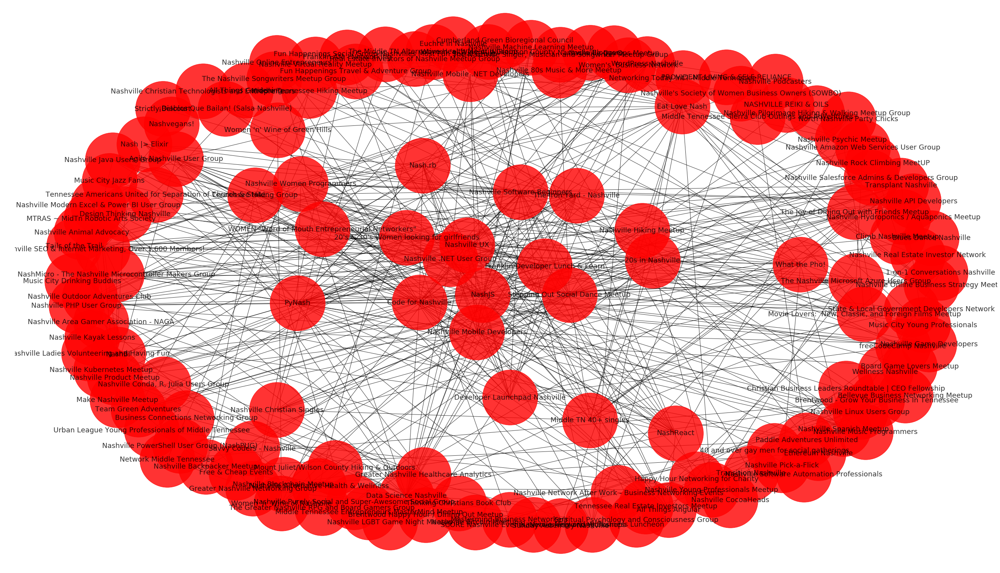

In [30]:
plt.figure(figsize=(35,20))
nx.draw(G, pos=nx.spring_layout(G, k=4, seed=10), node_size=20000, 
        with_labels=True, alpha=0.8, font_size=18);

## Try Clustering the Network

Now, that the dataset is a little more manageable, try clustering the remaining group nodes.

In [31]:
#Your code here
gn_clus = list(nx.algorithms.community.centrality.girvan_newman(G))
for n, clus in enumerate(gn_clus):
    print('Edges cut: {}, # clusters: {}'.format(n, len(clus)))

Edges cut: 0, # clusters: 7
Edges cut: 1, # clusters: 8
Edges cut: 2, # clusters: 9
Edges cut: 3, # clusters: 10
Edges cut: 4, # clusters: 11
Edges cut: 5, # clusters: 12
Edges cut: 6, # clusters: 13
Edges cut: 7, # clusters: 14
Edges cut: 8, # clusters: 15
Edges cut: 9, # clusters: 16
Edges cut: 10, # clusters: 17
Edges cut: 11, # clusters: 18
Edges cut: 12, # clusters: 19
Edges cut: 13, # clusters: 20
Edges cut: 14, # clusters: 21
Edges cut: 15, # clusters: 22
Edges cut: 16, # clusters: 23
Edges cut: 17, # clusters: 24
Edges cut: 18, # clusters: 25
Edges cut: 19, # clusters: 26
Edges cut: 20, # clusters: 27
Edges cut: 21, # clusters: 28
Edges cut: 22, # clusters: 29
Edges cut: 23, # clusters: 30
Edges cut: 24, # clusters: 31
Edges cut: 25, # clusters: 32
Edges cut: 26, # clusters: 33
Edges cut: 27, # clusters: 34
Edges cut: 28, # clusters: 35
Edges cut: 29, # clusters: 36
Edges cut: 30, # clusters: 37
Edges cut: 31, # clusters: 38
Edges cut: 32, # clusters: 39
Edges cut: 33, # cluste

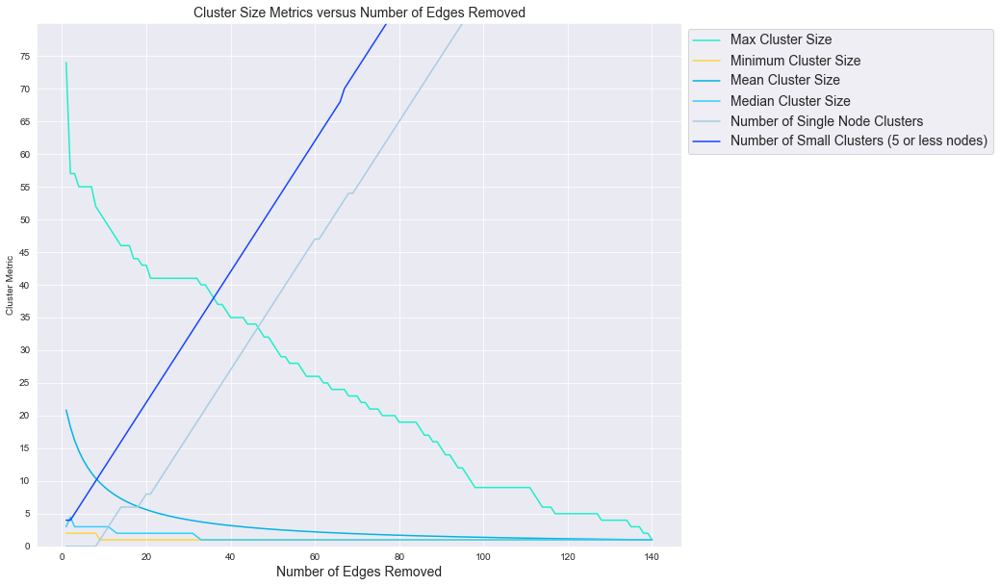

In [55]:
colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
      "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99",
      "#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99",
      "#b15928","#8dd3c7","#ffffb3","#bebada","#fb8072","#80b1d3",
      "#fdb462","#b3de69","#fccde5","#d9d9d9","#bc80bd","#ccebc5",
      "#ffed6f","#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
      "#80cdc1", "#35978f", "#01665e", "#003c30"]

import seaborn as sns
sns.set_style('darkgrid')
fig = plt.figure(figsize=(12,10))

y = [len(cluster) for cluster in gn_clus]
x = [n+1 for n in range(len(gn_clus))]

max_cluster_size = [max([len(c) for c in cluster]) for cluster in gn_clus]
plt.plot(x,max_cluster_size, color=colors[0], label='Max Cluster Size')

min_cluster_size = [min([len(c) for c in cluster]) for cluster in gn_clus]
plt.plot(x,min_cluster_size, color=colors[1], label='Minimum Cluster Size')

mean_cluster_size = [np.mean([len(c) for c in cluster]) for cluster in gn_clus]
plt.plot(x,mean_cluster_size, color=colors[2], label='Mean Cluster Size')

median_cluster_size = [np.median([len(c) for c in cluster]) for cluster in gn_clus]
plt.plot(x,median_cluster_size, color=colors[3], label='Median Cluster Size')

single_node_clusters = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in gn_clus]
plt.plot(x,single_node_clusters, color=colors[6], label='Number of Single Node Clusters')

small_clusters = [sum([1 if len(c)<=5 else 0 for c in cluster ]) for cluster in gn_clus]
plt.plot(x,small_clusters, color=colors[5], label='Number of Small Clusters (5 or less nodes)')

plt.legend(loc=(1.01,.75), fontsize=14)
plt.title('Cluster Size Metrics versus Number of Edges Removed', fontsize=14)
plt.xlabel('Number of Edges Removed', fontsize=14)
plt.ylabel('Cluster Metric')
plt.ylim(0,80)
plt.yticks(ticks=list(range(0,80,5)))
plt.show();

In [59]:
for i, j in list(zip(x, single_node_clusters)):
    print('Edges cut:', i, 'Single node clus:', j)

Edges cut: 1 Single node clus: 0
Edges cut: 2 Single node clus: 0
Edges cut: 3 Single node clus: 0
Edges cut: 4 Single node clus: 0
Edges cut: 5 Single node clus: 0
Edges cut: 6 Single node clus: 0
Edges cut: 7 Single node clus: 0
Edges cut: 8 Single node clus: 0
Edges cut: 9 Single node clus: 1
Edges cut: 10 Single node clus: 2
Edges cut: 11 Single node clus: 3
Edges cut: 12 Single node clus: 4
Edges cut: 13 Single node clus: 5
Edges cut: 14 Single node clus: 6
Edges cut: 15 Single node clus: 6
Edges cut: 16 Single node clus: 6
Edges cut: 17 Single node clus: 6
Edges cut: 18 Single node clus: 6
Edges cut: 19 Single node clus: 7
Edges cut: 20 Single node clus: 8
Edges cut: 21 Single node clus: 8
Edges cut: 22 Single node clus: 9
Edges cut: 23 Single node clus: 10
Edges cut: 24 Single node clus: 11
Edges cut: 25 Single node clus: 12
Edges cut: 26 Single node clus: 13
Edges cut: 27 Single node clus: 14
Edges cut: 28 Single node clus: 15
Edges cut: 29 Single node clus: 16
Edges cut: 30 Si

In [57]:
for k in range(2, 15):
    k_clusters = list(nx.algorithms.community.k_clique_communities(G, k=k))
    print('For k={}: {} clusters'.format(k, len(k_clusters)))

For k=2: 6 clusters
For k=3: 4 clusters
For k=4: 5 clusters
For k=5: 3 clusters
For k=6: 3 clusters
For k=7: 2 clusters
For k=8: 2 clusters
For k=9: 1 clusters
For k=10: 1 clusters
For k=11: 1 clusters
For k=12: 1 clusters
For k=13: 0 clusters
For k=14: 0 clusters


## Determine An Optimal Clustering Schema

Finally, determine a final clustering organization.

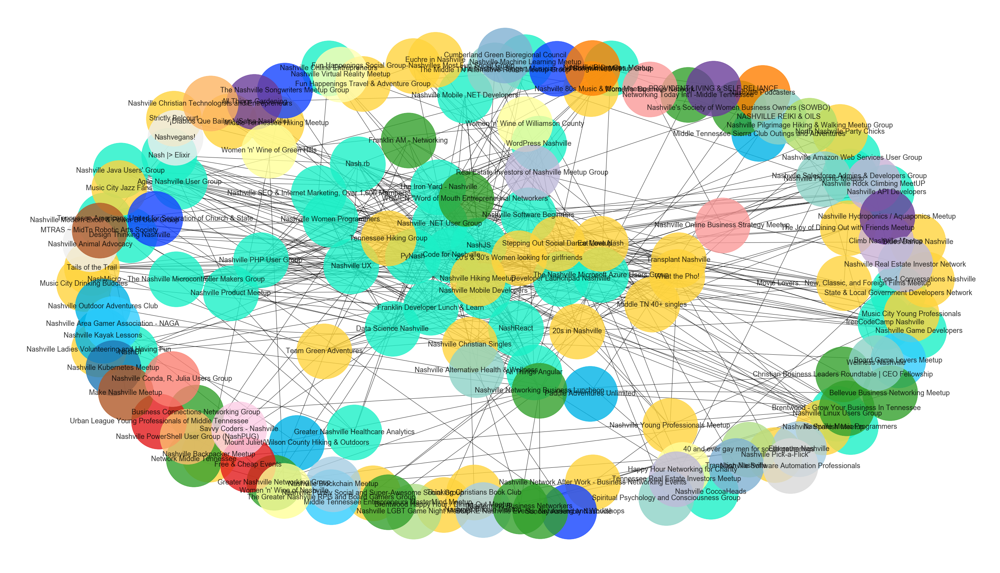

In [60]:
# Let's go with Girvan-Newman clustering, cutting 20 edges
def plot_girvan_newman(G, clusters):
    fig = plt.figure(figsize=(35,20))
    colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
              "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c",
              "#fb9a99","#e31a1c","#fdbf6f","#ff7f00","#cab2d6",
              "#6a3d9a","#ffff99","#b15928","#8dd3c7","#ffffb3",
              "#bebada","#fb8072","#80b1d3","#fdb462","#b3de69",
              "#fccde5","#d9d9d9","#bc80bd","#ccebc5","#ffed6f",
              "#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
              "#80cdc1", "#35978f", "#01665e", "#003c30"]
    for n, c in enumerate(clusters):
        ci = G.subgraph(c)
        nx.draw(ci, pos=nx.spring_layout(G, k=2.66, seed=10), with_labels=True,
                node_color=colors[n], alpha=0.8, node_size=20000, font_size=18)
    plt.show();

plot_girvan_newman(G, gn_clus[20])

In [61]:
clusters = pd.DataFrame(gn_clus[20]).transpose()
clusters.columns = ["Cluster{}".format(i) for i in range(1,len(clusters.columns)+1)]
clusters

,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,Cluster10,...,Cluster18,Cluster19,Cluster20,Cluster21,Cluster22,Cluster23,Cluster24,Cluster25,Cluster26,Cluster27
0,"Nashville SEO & Internet Marketing, Over 1,600...",20's & 30's Women looking for girlfriends,Nashville Kayak Lessons,Nashville Area Gamer Association - NAGA,Nashville Animal Advocacy,"The Nashville Singer, Musician and Songwriter ...",Ethereum Nashville,Nashville Kubernetes Meetup,Nashville LGBT Game Night Meetup,Brentwood - Grow Your Business In Tennessee,...,MTRAS ~ MidTn Robotic Arts Society,Nashville Alternative Health & Wellness,Nashville Virtual Reality Meetup,Tennessee Real Estate Investors Meetup,"Nashville Conda, R, Julia Users Group",Transition Nashville,Nashville Christian Technologists and Entrepre...,Nashville Pilgrimage Hiking & Walking Meetup G...,Savvy Coders - Nashville,Nashville Software Automation Professionals
1,Nashville UX,Nashville Purely Social and Super-Awesome Soci...,Paddle Adventures Unlimited,The Greater Nashville RPG and Board Gamers Group,Nashvegans!,Tennessee Americans United for Separation of C...,Nashville Bitcoin Meetup,None,40 and over gay men for social gatherings,"WOMEN ""Word of Mouth Entrepreneurial Networkers""",...,Make Nashville Meetup,Spiritual Psychology and Consciousness Group,None,Real Estate Investors of Nashville Meetup Group,None,Cumberland Green Bioregional Council,None,None,None,None
2,freeCodeCamp Nashville,20s in Nashville,Mount Juliet/Wilson County Hiking & Outdoors,Board Game Lovers Meetup,None,Sunday Assembly Nashville,Nashville Blockchain Meetup,None,None,Middle Tennessee Entrepreneurs MasterMind Meetup,...,None,Nashville Psychic Meetup,None,Nashville Real Estate Investor Network,None,None,None,None,None,None
3,Nashville DevOps Meetup,Transplant Nashville,Middle Tennessee Sierra Club Outings and Adven...,None,None,The Nashville Songwriters Meetup Group,None,None,None,"SCORE Nashville Events, Networking and Workshops",...,None,Wellness Nashville,None,None,None,None,None,None,None,None
4,PyNash,The Joy of Dining Out with Friends Meetup,Nashville Outdoor Adventures Club,None,None,None,None,None,None,Nashville's Society of Women Business Owners (...,...,None,NASHVILLE REIKI & OILS,None,None,None,None,None,None,None,None
5,Nashville Mobile .NET Developers,Nashville Network After Work - Business Networ...,None,None,None,None,None,None,None,Bellevue Business Networking Meetup,...,None,The Middle TN Alternative Health Meetup Group,None,None,None,None,None,None,None,None
6,NashMicro - The Nashville Microcontroller Make...,1-on-1 Conversations Nashville,None,None,None,None,None,None,None,Networking Today Int'l -Middle Tennessee,...,None,None,None,None,None,None,None,None,None,None
7,Nashville Game Developers,Eat Love Nash,None,None,None,None,None,None,None,Franklin AM - Networking,...,None,None,None,None,None,None,None,None,None,None
8,Nashville Mobile Developers,Brentwood Happy Hour / Dining Out Meetup,None,None,None,None,None,None,None,Nashville Networking Business Luncheon,...,None,None,None,None,None,None,None,None,None,None
9,Data Science Nashville,Euchre in Nashville,None,None,None,None,None,None,None,Network Middle Tennessee,...,None,None,None,None,None,None,None,None,None,None


## Visualize the Clusters

Analyze the output of your clustering schema. Do any clusters of groups stand out to you?

Clear themes emerge in these clusters, e.g., tech, real estate, spirituality, etc. Interestingly, there are a few clearly tech-related groups that are disconnected from the others (clusters 8, 24, and 26). Why are these groups isolated?

## Summary

In this lab, you got another chance to practice your network clustering skills, investigating a meetup dataset of events and groups surrounding the Nashville area. If you're up for the challenge, feel free to continue investigating the dataset and trying to cluster users or events!                                                                                                                                                               